<font color=purple > _**Emily Nordhoff - 2022**_ </font>

# Unsupervised Machine Learning

This script contains a k-means clustering model using pitch and hit variables from all balls in play in the MLB 
2021 season. Data was gathered from BaseballSavant.com.

### Contents

    1. Importing data and libraries
    2. Data prep for clustering
        2.1 Subset data
        2.2 Check for missing values
        2.3 Scale variables
    3. Elbow technique
    4. K-means clustering
    5. Visualizations and observations
    6. K-means clustering part II

## 1. Importing data and libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import os
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [2]:
path = r'/Users/Emily/Documents/CF Data Analysis Program/Immersion 6/Hits Analysis/'

In [3]:
df = pd.read_pickle(os.path.join(path,'02 data','prepared data','bip_ballparks_merged_gis.pkl'))

In [4]:
df.head()

,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,p_throws,...,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state
0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,L,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,L,...,away,Flare/Burner,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,R,...,home,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,L,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,R,...,home,Barrel,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida


In [5]:
df.reset_index(inplace=True)
df.rename(columns={'index':'id'}, inplace=True)
df.head()

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,away,Flare/Burner,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,home,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,home,Barrel,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121707 entries, 0 to 121706
Data columns (total 58 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     121707 non-null  int64  
 1   pitch_type             121654 non-null  object 
 2   game_date              121707 non-null  object 
 3   release_speed          121653 non-null  float64
 4   player_name            121707 non-null  object 
 5   batter                 121707 non-null  int64  
 6   pitcher                121707 non-null  int64  
 7   events                 121707 non-null  object 
 8   zone                   121654 non-null  float64
 9   stand                  121707 non-null  object 
 10  p_throws               121707 non-null  object 
 11  home_team              121707 non-null  object 
 12  away_team              121707 non-null  object 
 13  hit_location           115340 non-null  float64
 14  bb_type                121703 non-nu

## 2. Data prep for clustering model

### 2.1 Subset data

In [7]:
'''

# identify all the useful numeric columns
# might have to slim this down to a smaller number of columns
# (or maybe perform PCA?!?!?)

columns = ['release_speed',
          'pfx_x',
          'pfx_z',
          'plate_x',
          'plate_z',
          'vx0',
          'vy0',
          'vz0',
          'ax',
          'ay',
          'az',
          'hit_distance_sc',
          'launch_speed',
          'launch_angle']
          
'''

"\n\n# identify all the useful numeric columns\n# might have to slim this down to a smaller number of columns\n# (or maybe perform PCA?!?!?)\n\ncolumns = ['release_speed',\n          'pfx_x',\n          'pfx_z',\n          'plate_x',\n          'plate_z',\n          'vx0',\n          'vy0',\n          'vz0',\n          'ax',\n          'ay',\n          'az',\n          'hit_distance_sc',\n          'launch_speed',\n          'launch_angle']\n          \n"

In [8]:
# identify all the useful numeric columns
# might have to slim this down to a smaller number of columns
# (or maybe perform PCA?!?!?)

columns = ['release_speed',
          'pfx_x',
          'pfx_z',
          'plate_x',
          'plate_z',
          'vx0',
          'vy0',
          'vz0',
          'ax',
          'ay',
          'az']

In [9]:
# subset for just the home runs

df2 = df[columns].loc[df['events'] == 'home_run']

In [10]:
df2.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
20,77.1,1.42,0.72,0.16,1.99,-8.067947,-111.990784,-1.318431,13.510652,22.445496,-26.092514
56,88.6,0.14,0.82,0.71,2.28,4.478044,-129.057787,-3.210782,0.625105,26.799068,-22.556280
59,89.0,1.05,0.85,0.24,2.55,-3.577797,-129.551960,-4.374543,12.599927,28.755035,-21.928535
105,89.9,1.33,1.07,0.73,2.65,-5.732619,-130.785103,-4.905889,16.517801,29.189072,-19.022148
137,96.2,-1.36,0.97,-0.26,2.61,5.752009,-139.900294,-5.508058,-19.151922,33.500467,-18.359680


### 2.2 Check for (and handle) missing values

In [11]:
df2.isnull().sum()

release_speed    9
pfx_x            9
pfx_z            9
plate_x          9
plate_z          9
vx0              9
vy0              9
vz0              9
ax               9
ay               9
az               9
dtype: int64

In [12]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)

In [13]:
df2.shape

(5935, 11)

### 2.3 Scaling

In [14]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

In [15]:
# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-1.977605,1.870184,-0.073390,0.393645,-0.980493,-1.779187,2.009423,0.992659,1.536337,-1.031272,-0.466824
1,-0.052944,0.313023,0.071168,1.731138,-0.394087,0.447176,0.034015,0.284179,0.266212,0.067146,-0.051394
2,0.014001,1.420067,0.114535,0.588190,0.151876,-0.982382,-0.023182,-0.151522,1.446567,0.560641,0.022352
3,0.164627,1.760696,0.432562,1.779774,0.354085,-1.364768,-0.165912,-0.350453,1.832751,0.670150,0.363789
4,1.219006,-1.511775,0.288005,-0.627713,0.273202,0.673249,-1.220943,-0.575900,-1.683205,1.757927,0.441615


In [16]:
# just to compare the original vs. scaled data

df2.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
20,77.1,1.42,0.72,0.16,1.99,-8.067947,-111.990784,-1.318431,13.510652,22.445496,-26.092514
56,88.6,0.14,0.82,0.71,2.28,4.478044,-129.057787,-3.210782,0.625105,26.799068,-22.556280
59,89.0,1.05,0.85,0.24,2.55,-3.577797,-129.551960,-4.374543,12.599927,28.755035,-21.928535
105,89.9,1.33,1.07,0.73,2.65,-5.732619,-130.785103,-4.905889,16.517801,29.189072,-19.022148
137,96.2,-1.36,0.97,-0.26,2.61,5.752009,-139.900294,-5.508058,-19.151922,33.500467,-18.359680


## 3. Elbow technique

In [17]:
# Defines the range of potential clusters in the data.

num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.

kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [18]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-65285.000000000015,
 -42978.477861022344,
 -33790.69359617554,
 -30259.270031332395,
 -27865.93133427373,
 -26083.67665077504,
 -24893.5503861423,
 -23755.08746613865,
 -22817.427272327353]

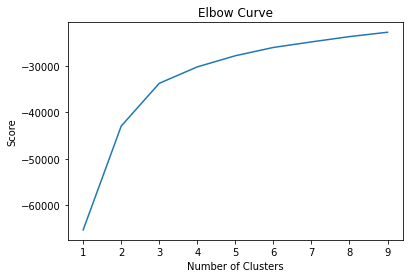

In [19]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

This elbow curve is not very definitive on the appropriate number of clusters. The change in variation diminishes after 3 clusters, but just 3 might not account for the differences in the data. A few possible reasons: there are too many variables and maybe they should be reduced or more focused, the types of clusters aren't well identified, the data isn't normally distributed, so the incorrect scaler was used. <br> <br> Regardless, I'm going to move forward with the k-means clustering using 3 clusters.

## 4. K-means clustering

In [20]:
kmeans = KMeans(n_clusters = 4) 

In [21]:
kmeans.fit(df_scaled)

KMeans(n_clusters=4)

In [22]:
df_scaled['clusters_hr'] = kmeans.fit_predict(df_scaled)
df2['clusters_hr'] = kmeans.fit_predict(df_scaled)

## 5. Merge with original df

In [23]:
df3 = df2.reset_index().rename(columns={'index': 'id'})
df3.head()

,id,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az,clusters_hr
0,20,77.1,1.42,0.72,0.16,1.99,-8.067947,-111.990784,-1.318431,13.510652,22.445496,-26.092514,0
1,56,88.6,0.14,0.82,0.71,2.28,4.478044,-129.057787,-3.210782,0.625105,26.799068,-22.556280,2
2,59,89.0,1.05,0.85,0.24,2.55,-3.577797,-129.551960,-4.374543,12.599927,28.755035,-21.928535,3
3,105,89.9,1.33,1.07,0.73,2.65,-5.732619,-130.785103,-4.905889,16.517801,29.189072,-19.022148,3
4,137,96.2,-1.36,0.97,-0.26,2.61,5.752009,-139.900294,-5.508058,-19.151922,33.500467,-18.359680,1


In [24]:
df.head()

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,away,Flare/Burner,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,home,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,away,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,home,Barrel,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida


In [25]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged = df.merge(df3[['id','clusters_hr']], on='id', how='left')
df_merged.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,contact,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,Flare/Burner,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,Barrel,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,Solid Contact,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,Solid Contact,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,Topped,1.0,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,Under,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN


In [26]:
df_merged_hr = df_merged.loc[df_merged['clusters_hr'].isnull() == False]

In [27]:
df2['clusters_hr'].value_counts()

1    2234
2    1407
0    1166
3    1128
Name: clusters_hr, dtype: int64

## 6. Visualizations and observations

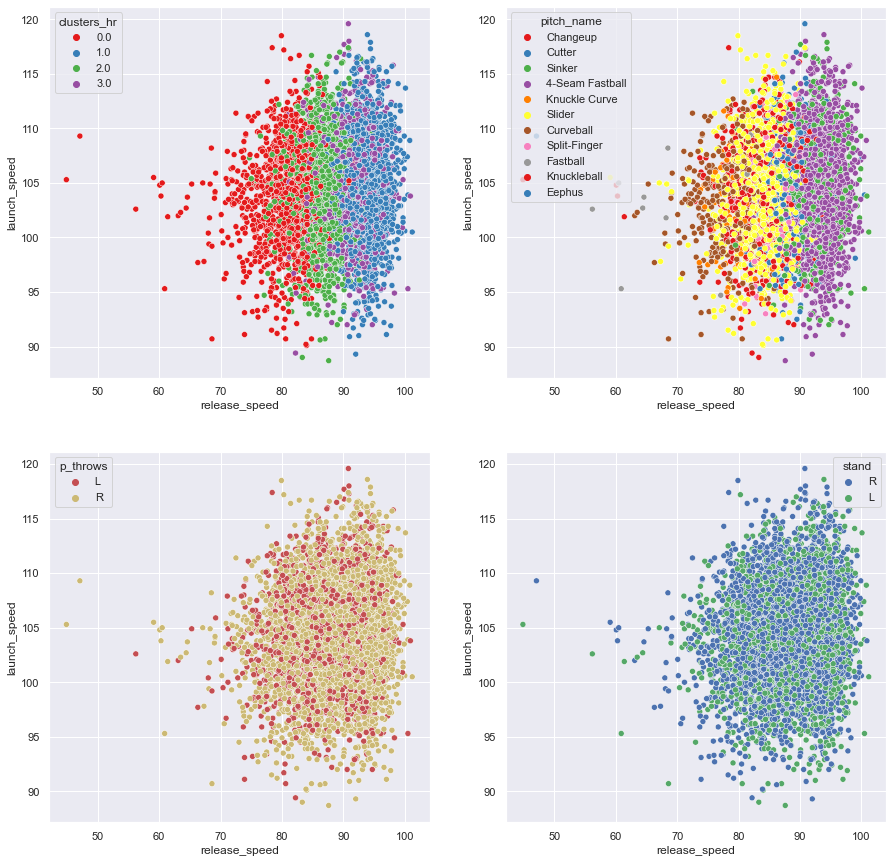

In [28]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='release_speed', y='launch_speed', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='launch_speed', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='launch_speed', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='launch_speed', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

This scatterplot compares <strong>release speed of the pitch </strong> and <strong>speed of the ball off the bat </strong>. The clustering separates the data largely by speed of the pitch, irrespective of speed of the batted ball. 

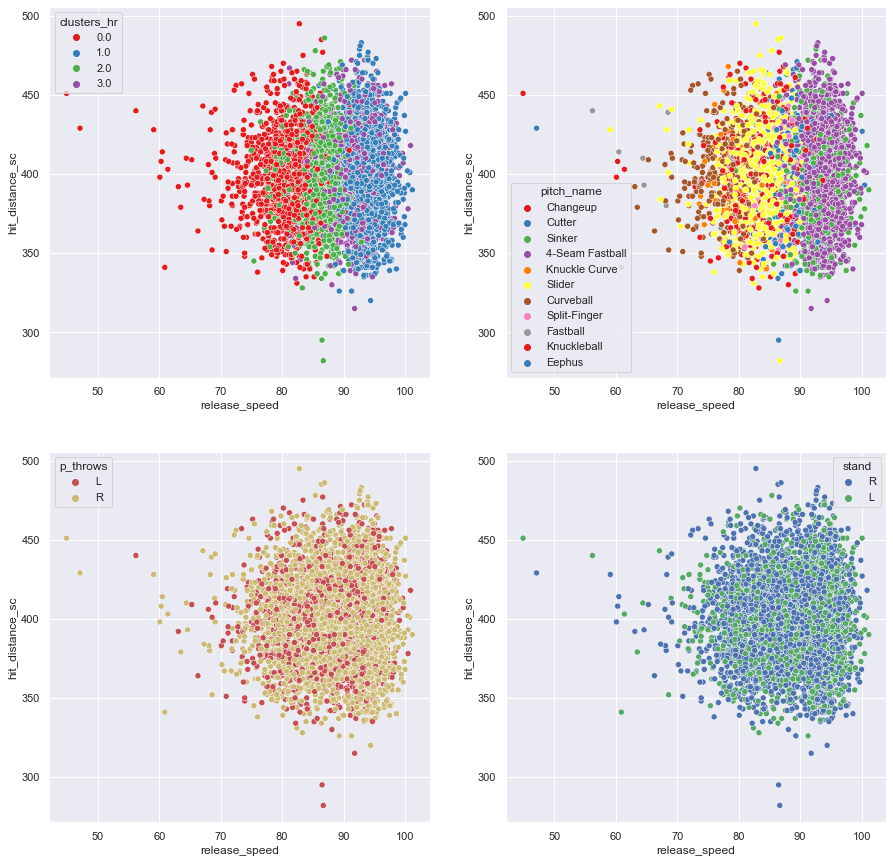

In [29]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='release_speed', y='hit_distance_sc', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='hit_distance_sc', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='hit_distance_sc', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='release_speed', y='hit_distance_sc', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

This scatterplot compares <strong>speed of the ball off the bat </strong>and the <strong>distance of the hit </strong>. The clustering doesn't yield any information with this plot. 

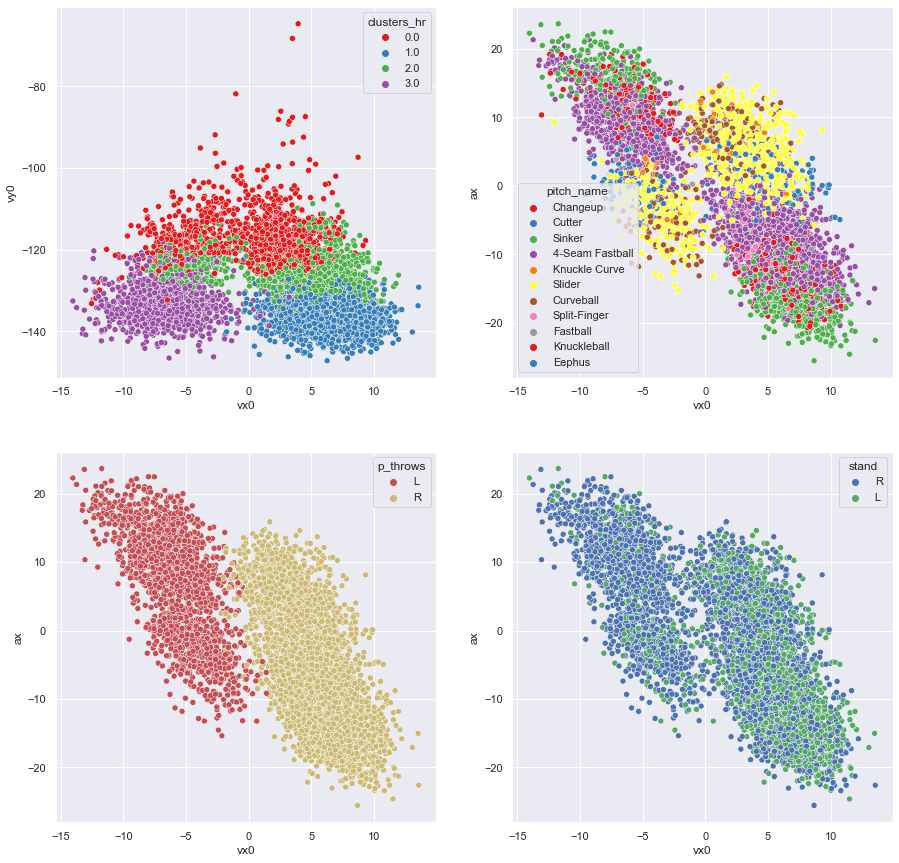

In [30]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='vx0', y='vy0', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='vx0', y='ax', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='vx0', y='ax', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='vx0', y='ax', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

This scatterplot compares <strong>velocity of the pitch in the horizontal plane</strong> (in feet/second) and the <strong>acceleration of the pitch in the same plane</strong> (in ft/second/second). The scatterplot shows a negative relationship (linear-ish) between the two variables. The clustering groups together the pitches that have (absolute value of) high velocity and (absolute value of) and high acceleration while the third group has lower horizontal acceleration or velocity. It's interesting to see that there's a gap where velocity and acceleration are zero (which means no horizontal movement).

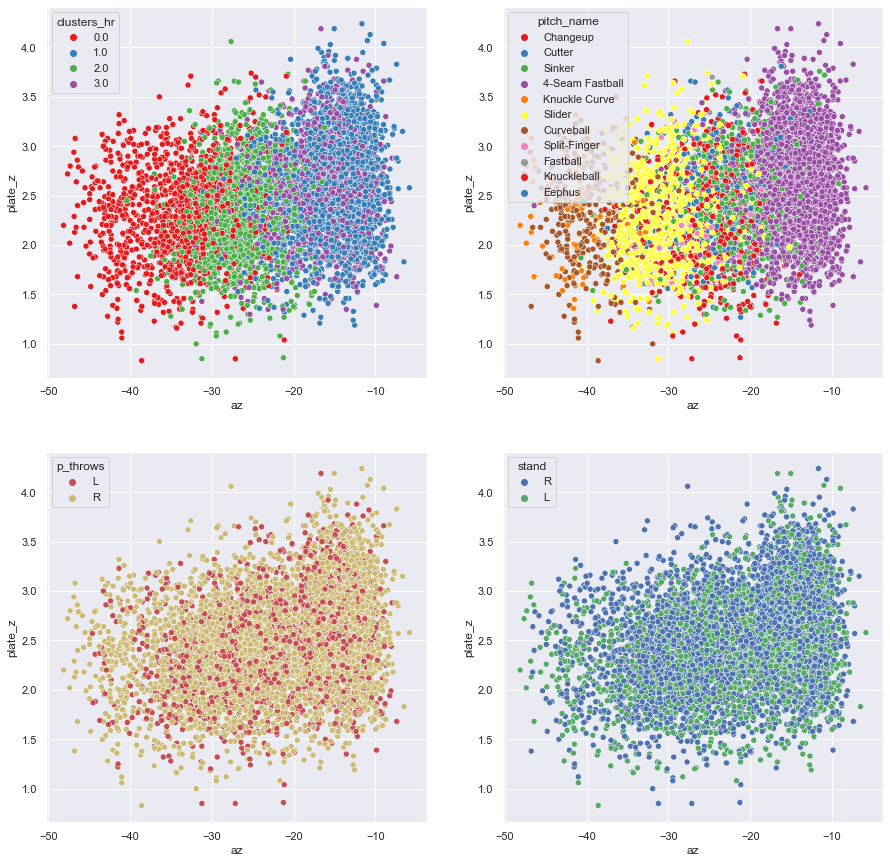

In [31]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='az', y='plate_z', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='az', y='plate_z', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='az', y='plate_z', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='az', y='plate_z', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

This scatterplot compares <strong>height of the ball when it crosses the plate</strong> (in feet) and the <strong>acceleration of the pitch in the vertical plane</strong> (in ft/second/second). The clustering is mostly due to the change in acceleration and not related to the height of the pitch. Similar to the previous task (6.4) this is another indication that the height of the pitch when it crosses the plate has little correlation to the rest of the stats of a home run.

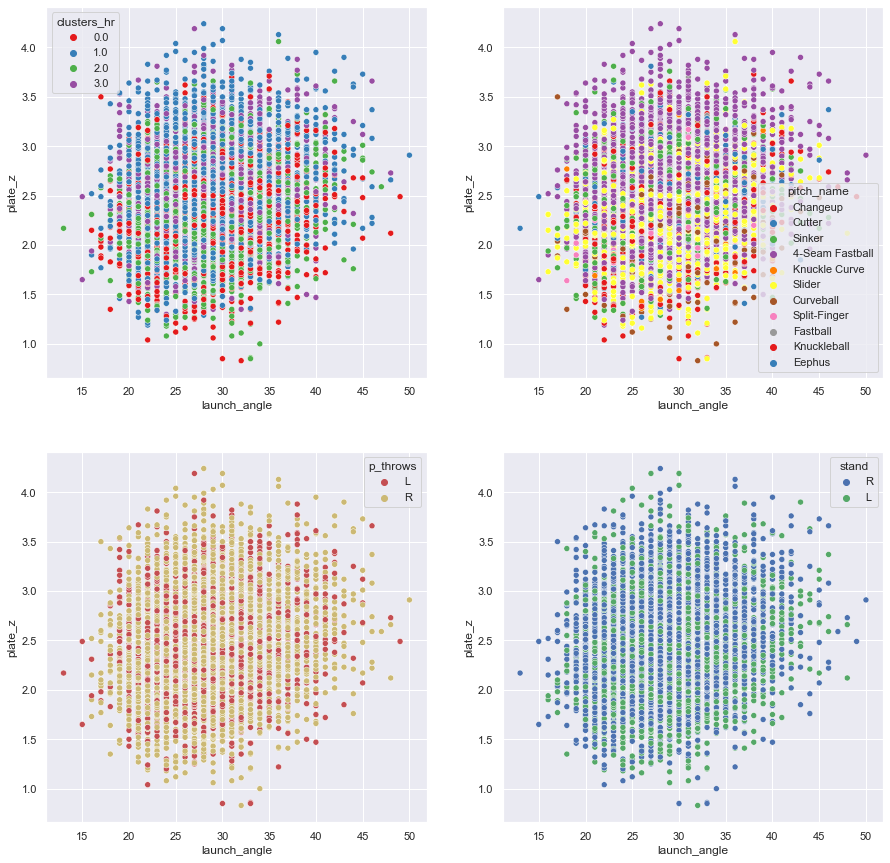

In [32]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='launch_angle', y='plate_z', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='launch_angle', y='plate_z', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='launch_angle', y='plate_z', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='launch_angle', y='plate_z', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

This scatterplot compares <strong>height of the ball when it crosses the plate</strong> (in feet) and the <strong>launch angle of the ball off the bat</strong>. There is no order to the clustering.

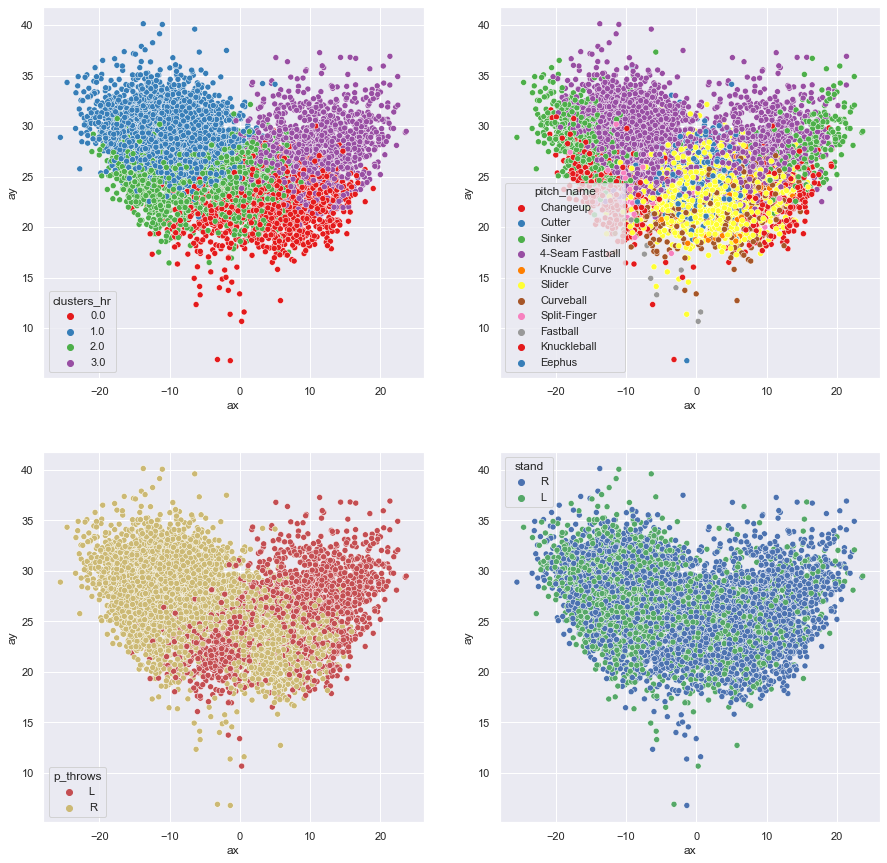

In [33]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='ax', y='ay', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='ax', y='ay', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='ax', y='ay', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='ax', y='ay', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()


This scatterplot compares <strong>acceleration of the pitch in the horizontal (x) dimension </strong> (in feet/second/second) and the <strong>acceleration of the pitch in the front-to-back (y) dimension</strong> (the plane extending from the pitcher to the catcher in ft/second/second). Again, we see a noticable gap when ax is close to zero. What isn't taken into account here is the handedness of the pitchers, which would influence the ax significantly depending on which side of the body the ball was being released.

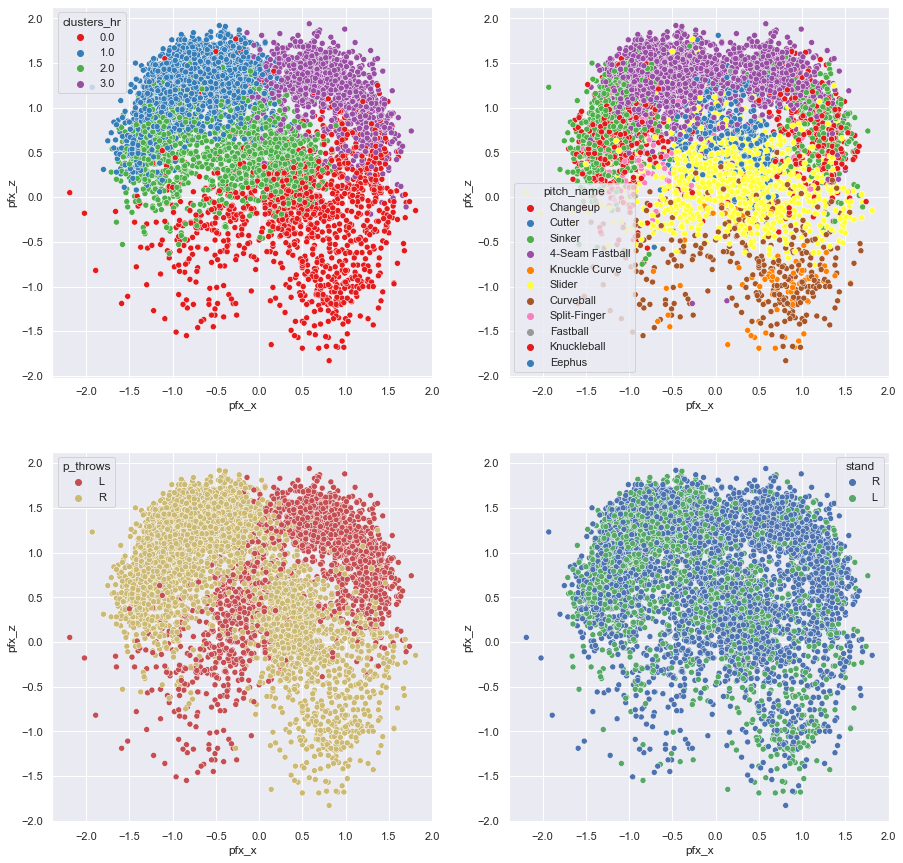

In [34]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_hr, x='pfx_x', y='pfx_z', hue='clusters_hr', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_hr, x='pfx_x', y='pfx_z', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_hr, x='pfx_x', y='pfx_z', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_hr, x='pfx_x', y='pfx_z', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

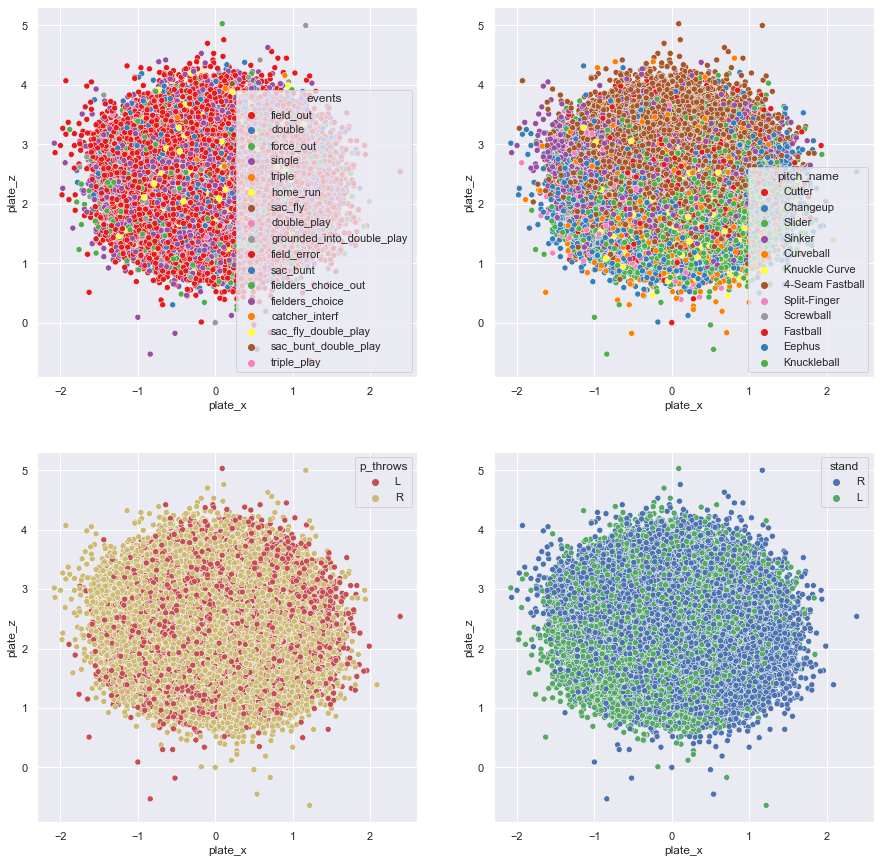

In [35]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged, x='plate_x', y='plate_z', hue='events', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged, x='plate_x', y='plate_z', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged, x='plate_x', y='plate_z', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged, x='plate_x', y='plate_z', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

In [36]:
'''
df2.groupby('clusters_hr').agg({'release_speed':['mean', 'median'],
                            'pfx_x':['mean', 'median'],
                            'pfx_z':['mean', 'median'],
                            'plate_x':['mean', 'median'],
                            'plate_z':['mean', 'median'],
                            'vx0':['mean', 'median'],
                            'vy0':['mean', 'median'],
                            'vz0':['mean', 'median'],
                            'ax':['mean', 'median'],
                            'ay':['mean', 'median'],
                            'az':['mean', 'median'],
                            'hit_distance_sc':['mean', 'median'],
                            'launch_speed':['mean', 'median'],
                            'launch_angle':['mean', 'median']}).transpose()
'''

"\ndf2.groupby('clusters_hr').agg({'release_speed':['mean', 'median'],\n                            'pfx_x':['mean', 'median'],\n                            'pfx_z':['mean', 'median'],\n                            'plate_x':['mean', 'median'],\n                            'plate_z':['mean', 'median'],\n                            'vx0':['mean', 'median'],\n                            'vy0':['mean', 'median'],\n                            'vz0':['mean', 'median'],\n                            'ax':['mean', 'median'],\n                            'ay':['mean', 'median'],\n                            'az':['mean', 'median'],\n                            'hit_distance_sc':['mean', 'median'],\n                            'launch_speed':['mean', 'median'],\n                            'launch_angle':['mean', 'median']}).transpose()\n"

In [37]:
df2.groupby('clusters_hr').agg({'release_speed':['mean', 'median'],
                            'pfx_x':['mean', 'median'],
                            'pfx_z':['mean', 'median'],
                            'plate_x':['mean', 'median'],
                            'plate_z':['mean', 'median'],
                            'vx0':['mean', 'median'],
                            'vy0':['mean', 'median'],
                            'vz0':['mean', 'median'],
                            'ax':['mean', 'median'],
                            'ay':['mean', 'median'],
                            'az':['mean', 'median']}).transpose()

clusters_hr                    0           1           2           3
release_speed mean     80.350257   93.721173   86.413930   91.376418
              median   81.000000   93.800000   86.600000   91.800000
pfx_x         mean      0.479117   -0.731683   -0.380675    0.811454
              median    0.610000   -0.720000   -0.300000    0.820000
pfx_z         mean     -0.191827    1.243133    0.493632    1.175957
              median   -0.150000    1.310000    0.490000    1.240000
plate_x       mean      0.054803   -0.011070   -0.046276    0.013138
              median    0.080000   -0.010000   -0.050000    0.020000
plate_z       mean      2.332856    2.597534    2.333859    2.554734
              median    2.330000    2.580000    2.320000    2.550000
vx0           mean      0.471563    6.100064    3.344596   -6.437756
              median    1.641278    6.072503    4.483997   -6.567042
vy0           mean   -116.980112 -136.284989 -125.788383 -132.853215
              median -117.902836 -136.318287 -126.031732 -133.480810
vz0           mean     -0.533862   -5.590261   -3.219309   -5.248424
              median   -0.685898   -5.589391   -3.196822   -5.299411
ax            mean      4.457309  -10.471642   -4.601520   10.950206
              median    5.215546  -10.343341   -2.729778   11.097083
ay            mean     22.021271   29.578952   24.256193   28.003840
              median   22.130271   29.486531   24.243192   28.018154
az            mean    -33.996665  -15.639338  -26.482164  -17.230763
              median  -33.644725  -14.953242  -26.546991  -16.480764

## 7. K-means part II

The above clustering looked at all homeruns, while interesting and important, I feel it is too broad and lumping many different pitchers and hitters all into the same data set. In this next section, the same clustering will be done, but zeroing in on just one hitter: <strong>J.P. Crawford </strong>of the Seattle Mariners.

In [38]:
# subset for just the home runs

jp = df[columns].loc[df['player_name'] == 'Crawford, J.P.']

In [39]:
jp.shape

(510, 11)

In [40]:
# check for missing values

jp.isnull().sum()

release_speed    0
pfx_x            0
pfx_z            0
plate_x          0
plate_z          0
vx0              0
vy0              0
vz0              0
ax               0
ay               0
az               0
dtype: int64

In [43]:
jp.dropna(inplace=True)

In [44]:
# scale the data set

scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(jp), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-0.486136,0.297936,-0.190252,-1.212393,-0.506650,-1.472950,0.502654,0.487212,0.441923,-0.206576,-0.346998
1,-1.706755,1.607728,-1.569806,-0.098091,-0.524788,0.069368,1.702137,1.138289,1.187054,-0.500513,-1.517870
2,0.985787,-0.032360,1.131820,1.113958,0.853688,0.988033,-0.972758,-0.652775,-0.162444,1.222850,1.255689
3,1.219141,-0.362655,1.462339,1.602687,-0.397823,1.361706,-1.175669,-1.481077,-0.565429,1.586005,1.733558
4,-1.706755,-1.216867,-1.382992,-0.117640,-1.486094,-0.856343,1.722608,1.506705,-0.721158,-0.417147,-1.405622


In [45]:
# Defines the range of potential clusters in the data.

num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.

kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [46]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-5609.999999999998,
 -3747.9379641458668,
 -2790.792626383298,
 -2449.579312822542,
 -2267.257744387912,
 -2112.184772007928,
 -2008.2131189381562,
 -1912.6820063022237,
 -1829.9421732767737]

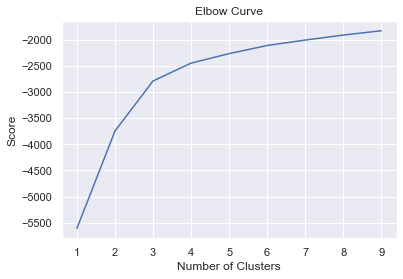

In [47]:
# plot the graph for the elbow technique

plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [48]:
kmeans = KMeans(n_clusters = 4) 
kmeans.fit(df_scaled)

KMeans(n_clusters=4)

In [49]:
df_scaled['clusters'] = kmeans.fit_predict(jp)
jp['clusters'] = kmeans.fit_predict(jp)

In [50]:
jp['clusters'].value_counts()

2    192
0    126
1    116
3     76
Name: clusters, dtype: int64

In [51]:
jp_hits = df.loc[df['player_name'] == 'Crawford, J.P.']
hits = ['single', 'double', 'triple', 'home_run']
hue_hits = jp_hits['events'].isin(hits)

ValueError: Could not interpret value `launch_speed` for parameter `y`

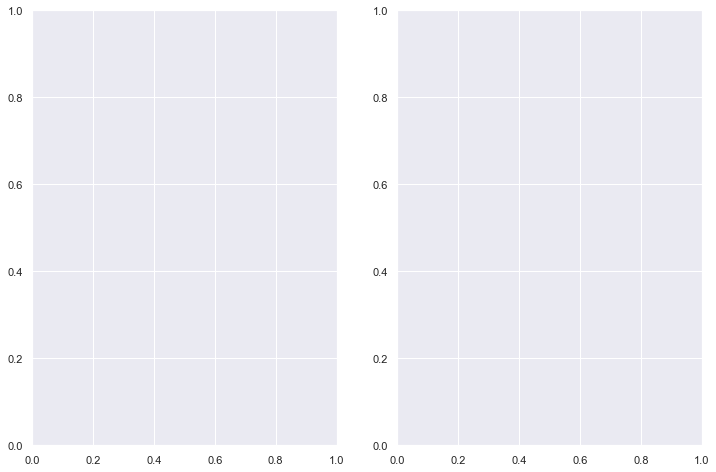

In [52]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp, x='release_speed', y='launch_speed', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp, x='release_speed', y='launch_speed', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

In [ ]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp, x='launch_speed', y='hit_distance_sc', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp, x='launch_speed', y='hit_distance_sc', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

In [ ]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp,  x='vx0', y='ax', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp,  x='vx0', y='ax', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

In [ ]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp, x='az', y='plate_z', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp, x='az', y='plate_z', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

In [ ]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp, x='launch_angle', y='plate_z', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp, x='launch_angle', y='plate_z', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

In [ ]:
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(data=jp, x='ax', y='ay', hue='clusters', palette='muted', ax=axes[0])
sns.scatterplot(data=jp, x='ax', y='ay', hue=hue_hits, palette=['r','y'], ax=axes[1])
plt.show()

I used the same scatter plots as in the above k-means clustering for the home runs, but I applied them to balls hit in play by J.P. Crawford. In addition, I color coded the same scatter plot with hits vs. no hits. This was to see if the clustering algorithm could identify hits. It didn't seem to yield the results I was hoping, but there are more ways to subset and run this clustering algoritm.

## 7. K-means Part III

In [53]:
# subset (not really) the whole data set, just using the numeric columns

df2 = df[columns]
print(df2.shape)
df2.head()

(121707, 11)


,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,82.7,0.20,0.58,-0.80,2.28,-9.320309,-120.130265,-0.463358,3.730978,23.623327,-26.715078
1,82.4,-0.31,0.70,-0.26,1.83,-7.072452,-119.826649,-1.587563,-1.639002,23.311028,-25.370558
2,83.8,-1.52,0.16,-0.03,2.59,6.335426,-121.872042,-0.011538,-16.403257,26.798484,-30.857113
3,82.7,-0.15,0.60,-0.88,2.01,-8.871268,-120.266230,-1.316870,0.168832,22.522652,-26.250798
4,88.0,0.67,0.25,0.03,1.96,2.416839,-127.971522,-1.724630,6.543631,33.261413,-29.334738


In [54]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)
df2.shape

/var/folders/k5/g_rc3lgx7x9d6wvbtl981b340000gn/T/ipykernel_32935/875440382.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.dropna(inplace=True)


(121653, 11)

In [55]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-1.039552,0.367899,-0.116366,-1.473661,-0.125758,-1.990360,1.064957,1.266326,0.548125,-0.745684,-0.392237
1,-1.089804,-0.210572,0.054294,-0.483163,-0.909947,-1.595150,1.100098,0.858561,0.051521,-0.825209,-0.235486
2,-0.855294,-1.583025,-0.713675,-0.061284,0.414461,0.762170,0.863361,1.430208,-1.313843,0.062853,-0.875137
3,-1.039552,-0.029091,-0.087923,-1.620401,-0.596272,-1.911411,1.049220,0.956746,0.218706,-1.025964,-0.338109
4,-0.151762,0.901000,-0.585680,0.048771,-0.683404,0.073219,0.157399,0.808845,0.808232,1.708602,-0.697651


In [56]:
# Elbow technique!

# Defines the range of potential clusters in the data.
num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.
kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [57]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-1338182.999999998,
 -897299.2443162797,
 -720470.5213696462,
 -640368.7656649816,
 -583199.6309610737,
 -549574.4098260235,
 -521797.5533204662,
 -494995.4634228043,
 -472610.82550432504]

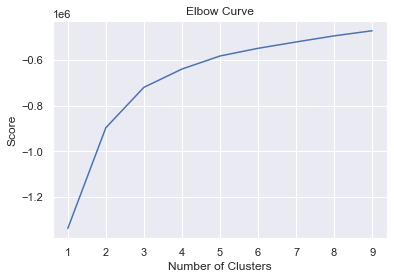

In [58]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [59]:
kmeans = KMeans(n_clusters = 3) 
kmeans.fit(df_scaled)

KMeans(n_clusters=3)

In [60]:
df_scaled['clusters_all'] = kmeans.fit_predict(df_scaled)
df2['clusters_all'] = kmeans.fit_predict(df_scaled)

/var/folders/k5/g_rc3lgx7x9d6wvbtl981b340000gn/T/ipykernel_32935/2703002332.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['clusters_all'] = kmeans.fit_predict(df_scaled)


In [61]:
df3 = df2.reset_index().rename(columns={'index': 'id'})

In [62]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged_2 = df_merged.merge(df3[['id','clusters_all']], on='id', how='left')
df_merged_2.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr,clusters_all
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,2.0
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,1.0,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0


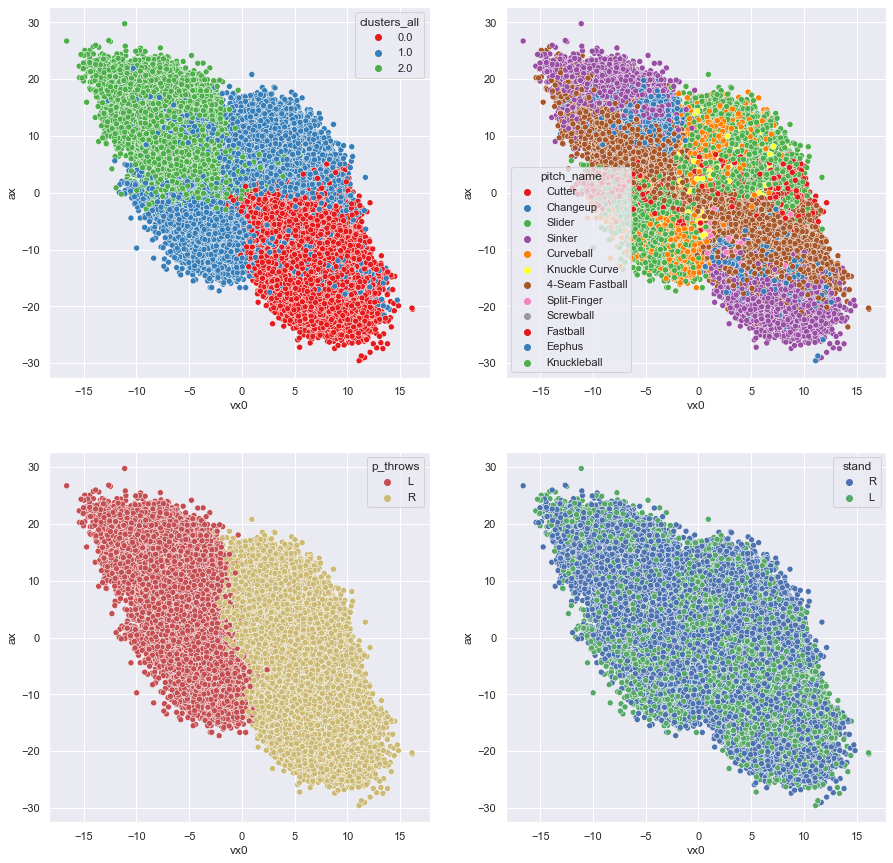

In [63]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_2, x='vx0', y='ax', hue='clusters_all', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_2, x='vx0', y='ax', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_2, x='vx0', y='ax', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_2, x='vx0', y='ax', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

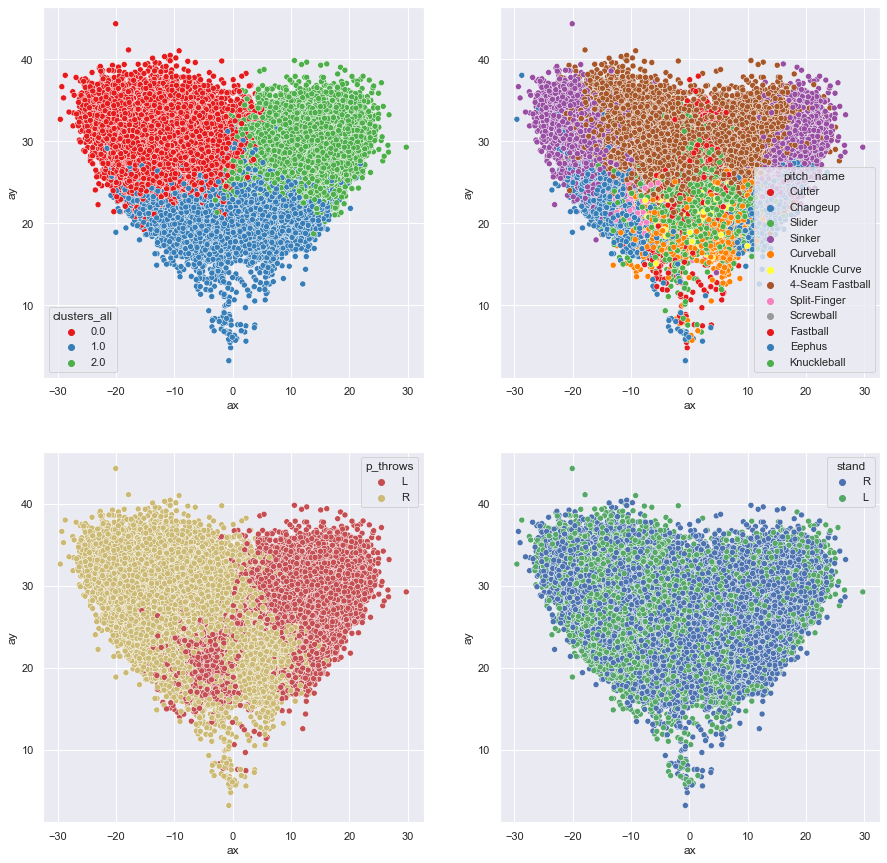

In [64]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_merged_2, x='ax', y='ay', hue='clusters_all', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_merged_2, x='ax', y='ay', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_merged_2, x='ax', y='ay', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_merged_2, x='ax', y='ay', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

In [65]:
df['contact'].value_counts()

Topped           38465
Under            30574
Flare/Burner     29218
Barrel            9638
Solid Contact     7441
Weak              5985
0                  386
Name: contact, dtype: int64

In [66]:
good_contact = ['Barrel', 'Solid Contact']

In [67]:
# subset for just the home runs

df2 = df[columns].loc[df['contact'].isin(good_contact)]
print(df2.shape)
df2.head()

(17079, 11)


,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
4,88.0,0.67,0.25,0.03,1.96,2.416839,-127.971522,-1.724630,6.543631,33.261413,-29.334738
5,89.7,0.11,0.41,-0.16,2.06,3.216723,-130.574666,-2.560116,0.484379,31.461575,-27.142820
6,88.0,1.32,1.05,0.22,2.55,-8.821604,-127.840578,-2.921909,16.404749,29.153960,-20.320075
19,82.1,-0.17,0.27,0.12,2.10,-6.587839,-119.484364,-0.271682,-0.396492,22.793924,-29.706709
20,77.1,1.42,0.72,0.16,1.99,-8.067947,-111.990784,-1.318431,13.510652,22.445496,-26.092514


In [68]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)
df2.shape

(17079, 11)

In [69]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-0.225500,0.959618,-0.752568,0.062489,-0.951846,0.065583,0.231639,0.888649,0.847744,1.630733,-0.855607
1,0.066213,0.286208,-0.522416,-0.402834,-0.752685,0.207110,-0.077339,0.579759,0.262677,1.175657,-0.600601
2,-0.225500,1.741254,0.398190,0.527813,0.223204,-1.922876,0.247181,0.445999,1.799910,0.592193,0.193152
3,-1.237915,-0.050497,-0.723799,0.282906,-0.673020,-1.527648,1.239015,1.425824,0.177622,-1.015896,-0.898881
4,-2.095894,1.861506,-0.076497,0.380869,-0.892098,-1.789529,2.128460,1.038827,1.520463,-1.103994,-0.478409


In [70]:
# Elbow technique!

# Defines the range of potential clusters in the data.
num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.
kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [71]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-187869.00000000006,
 -123734.7419491552,
 -96866.90229367804,
 -86722.0890485186,
 -79823.01091142421,
 -74551.91975231197,
 -71127.50877417796,
 -67976.50415892388,
 -65395.6035345922]

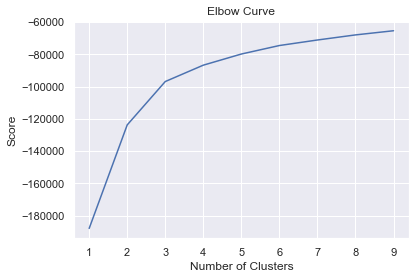

In [72]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [73]:
kmeans = KMeans(n_clusters = 3) 
kmeans.fit(df_scaled)

KMeans(n_clusters=3)

In [74]:
df_scaled['clusters_all'] = kmeans.fit_predict(df_scaled)
df2['clusters_all'] = kmeans.fit_predict(df_scaled)

In [75]:
df3 = df2.reset_index().rename(columns={'index': 'id'})

In [76]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged_2 = df_merged.merge(df3[['id','clusters_all']], on='id', how='left')
df_merged_2.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,runner_1b,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr,clusters_all
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,NaN,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,2.0
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,1.0,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,NaN,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN


In [77]:
# subset for just the home runs

df2 = df[columns].loc[df['p_throws'] == 'R']
print(df2.shape)
df2.head()

(85130, 11)


,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
2,83.8,-1.52,0.16,-0.03,2.59,6.335426,-121.872042,-0.011538,-16.403257,26.798484,-30.857113
4,88.0,0.67,0.25,0.03,1.96,2.416839,-127.971522,-1.724630,6.543631,33.261413,-29.334738
5,89.7,0.11,0.41,-0.16,2.06,3.216723,-130.574666,-2.560116,0.484379,31.461575,-27.142820
7,93.6,-0.85,0.58,-0.31,1.88,4.644846,-136.177410,-4.362362,-11.619891,31.395694,-24.157501
8,91.5,-1.16,0.21,-0.50,2.44,4.858874,-133.118644,-1.398517,-14.842607,30.016574,-29.562556


In [78]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)
df2.shape

(85104, 11)

In [79]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-0.927710,-1.426117,-0.670618,-0.023601,0.410488,0.395683,0.936825,1.397215,-1.119289,-0.004005,-0.838657
1,-0.225098,1.338627,-0.545821,0.087120,-0.684582,-1.149494,0.231900,0.789378,1.398446,1.632364,-0.666449
2,0.059293,0.631660,-0.323959,-0.263495,-0.510762,-0.834083,-0.068948,0.492931,0.733624,1.176658,-0.418502
3,0.711718,-0.580282,-0.088230,-0.540297,-0.823639,-0.270947,-0.716464,-0.146539,-0.594458,1.159977,-0.080808
4,0.360412,-0.971639,-0.601286,-0.890912,0.149757,-0.186551,-0.362959,0.905089,-0.948055,0.810793,-0.692219


In [80]:
# Elbow technique!

# Defines the range of potential clusters in the data.
num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.
kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [81]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-936143.9999999991,
 -561622.5554037027,
 -480697.44227545883,
 -427036.7005415094,
 -390213.5608992302,
 -365129.5362747267,
 -347303.55582670117,
 -333643.2435271287,
 -322338.1035417021]

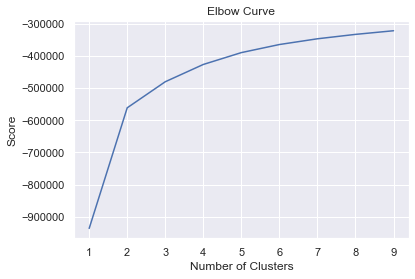

In [82]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [83]:
kmeans = KMeans(n_clusters = 3) 
kmeans.fit(df_scaled)

KMeans(n_clusters=3)

In [84]:
df_scaled['clusters_p_throws_R'] = kmeans.fit_predict(df_scaled)
df2['clusters_p_throws_R'] = kmeans.fit_predict(df_scaled)

In [85]:
df3 = df2.reset_index().rename(columns={'index': 'id'})

In [86]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged_3 = df_merged_2.merge(df3[['id','clusters_p_throws_R']], on='id', how='left')
df_merged_3.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,runner_2b,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr,clusters_all,clusters_p_throws_R
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,1.0,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0,2.0
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0,2.0
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,2.0,NaN
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,0.0
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,NaN,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN


In [87]:
# subset for just the home runs

df2 = df[columns].loc[df['p_throws'] == 'L']
print(df2.shape)
df2.head()

(36577, 11)


,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,82.7,0.20,0.58,-0.80,2.28,-9.320309,-120.130265,-0.463358,3.730978,23.623327,-26.715078
1,82.4,-0.31,0.70,-0.26,1.83,-7.072452,-119.826649,-1.587563,-1.639002,23.311028,-25.370558
3,82.7,-0.15,0.60,-0.88,2.01,-8.871268,-120.266230,-1.316870,0.168832,22.522652,-26.250798
6,88.0,1.32,1.05,0.22,2.55,-8.821604,-127.840578,-2.921909,16.404749,29.153960,-20.320075
9,70.6,-1.40,0.75,-0.02,2.29,-3.935678,-102.646145,1.016488,-9.036235,19.360454,-27.396330


In [88]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)
df2.shape

(36549, 11)

In [89]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-0.889775,-0.388120,-0.188924,-1.548775,-0.119664,-1.378759,0.913958,1.343087,-0.402384,-0.608955,-0.451549
1,-0.941281,-1.059066,-0.006374,-0.566498,-0.908588,-0.508946,0.950017,0.912112,-1.037836,-0.691041,-0.281946
2,-0.889775,-0.848573,-0.158499,-1.694298,-0.593018,-1.205002,0.897810,1.015885,-0.823907,-0.898264,-0.392983
3,0.020177,1.085331,0.526064,0.306638,0.353690,-1.185784,-0.001761,0.400576,1.097355,0.844756,0.355141
4,-2.967212,-2.493050,0.069689,-0.129930,-0.102132,0.704835,2.990467,1.910403,-1.913180,-1.729438,-0.537485


In [90]:
# Elbow technique!

# Defines the range of potential clusters in the data.
num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.
kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [91]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-402039.0000000005,
 -255340.67007293002,
 -208946.54540408473,
 -184998.6811326979,
 -167441.19953614892,
 -156350.9376422775,
 -148790.97428949035,
 -142366.90690757422,
 -136933.72259689748]

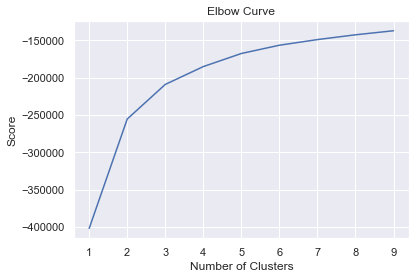

In [92]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [93]:
kmeans = KMeans(n_clusters = 3) 
kmeans.fit(df_scaled)

KMeans(n_clusters=3)

In [94]:
df_scaled['clusters_p_throws_L'] = kmeans.fit_predict(df_scaled)
df2['clusters_p_throws_L'] = kmeans.fit_predict(df_scaled)

In [95]:
df3 = df2.reset_index().rename(columns={'index': 'id'})

In [96]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged_4 = df_merged_3.merge(df3[['id','clusters_p_throws_L']], on='id', how='left')
df_merged_4.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,runner_3b,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr,clusters_all,clusters_p_throws_R,clusters_p_throws_L
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0,NaN
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0,2.0,NaN
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0,2.0,NaN
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,2.0,NaN,1.0
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,0.0,NaN
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0,NaN
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,NaN,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0


In [97]:
df['pitch_name'].value_counts()

4-Seam Fastball    40617
Sinker             22150
Slider             21636
Changeup           15909
Cutter              8883
Curveball           8246
Knuckle Curve       2122
Split-Finger        1849
Fastball             210
Eephus                16
Knuckleball           15
Screwball              1
Name: pitch_name, dtype: int64

In [98]:
# subset for just the home runs

df2 = df[columns].loc[df['pitch_name'] == '4-Seam Fastball']
print(df2.shape)
df2.head()

(40617, 11)


,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
24,92.4,-0.47,1.43,0.09,3.05,5.996582,-134.495637,-2.538828,-6.986741,29.629066,-14.507106
25,93.6,-0.65,1.53,-0.03,2.69,6.261518,-136.104771,-3.587323,-9.531215,31.094906,-12.612974
27,91.3,0.16,1.85,0.99,2.05,8.116848,-132.415649,-8.788421,0.033794,29.833594,-8.665805
33,92.4,-0.31,1.80,0.27,2.32,7.209810,-134.175301,-8.166208,-5.483270,31.816138,-8.774353
36,94.0,-0.68,1.38,0.21,2.93,6.756547,-136.743518,-2.937173,-10.112951,32.391176,-14.412733


In [99]:
# eliminate those records that have NaN values

df2.dropna(inplace=True)
df2.shape

(40616, 11)

In [100]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

# create new df with scaled data

df_scaled = pd.DataFrame(scaler.fit_transform(df2), columns=columns)
df_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az
0,-0.447163,-0.357559,0.426476,0.185758,0.794477,0.599594,0.410499,1.367672,-0.367940,0.106947,0.087546
1,0.017000,-0.633457,0.770317,-0.051959,0.138198,0.643124,-0.017440,0.909447,-0.642130,0.626116,0.569944
2,-0.872646,0.608086,1.870608,1.968636,-1.028522,0.947958,0.963657,-1.363594,0.388586,0.179387,1.575210
3,-0.447163,-0.112316,1.698687,0.542334,-0.536312,0.798930,0.495690,-1.091667,-0.205927,0.881560,1.547565
4,0.171721,-0.679440,0.254555,0.423475,0.575717,0.724458,-0.187310,1.193583,-0.704817,1.085226,0.111581


In [101]:
# Elbow technique!

# Defines the range of potential clusters in the data.
num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.
kmeans = [KMeans(n_clusters=i) for i in num_cl] 

In [102]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_scaled).score(df_scaled) for i in range(len(kmeans))]
score

[-446776.00000000035,
 -341318.5842144758,
 -292195.340016325,
 -262177.7209598553,
 -241607.74253241686,
 -223784.24887104274,
 -208840.89870460116,
 -199714.84583701103,
 -192429.71957118675]

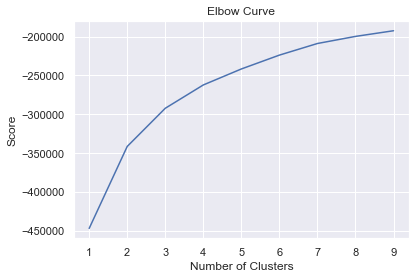

In [103]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [104]:
kmeans = KMeans(n_clusters = 2) 
kmeans.fit(df_scaled)

KMeans(n_clusters=2)

In [105]:
df_scaled['clusters_4sfb'] = kmeans.fit_predict(df_scaled)
df2['clusters_4sfb'] = kmeans.fit_predict(df_scaled)

In [106]:
df3 = df2.reset_index().rename(columns={'index': 'id'})

In [107]:
# merge the original df (with all the variables) with the subset df (with the hr clusters labled)

df_merged_5 = df_merged_4.merge(df3[['id','clusters_4sfb']], on='id', how='left')
df_merged_5.head(21)

,id,pitch_type,game_date,release_speed,player_name,batter,pitcher,events,zone,stand,...,scoring_play,Latitude,Longitude,park_city,park_state,clusters_hr,clusters_all,clusters_p_throws_R,clusters_p_throws_L,clusters_4sfb
0,0,FC,2021-04-30,82.7,"Altuve, Jose",514888,642232,field_out,4.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0,NaN
1,1,FC,2021-04-30,82.4,"Maldonado, Martín",455117,642232,field_out,8.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0,NaN
2,2,CH,2021-04-30,83.8,"Kiermaier, Kevin",595281,621121,field_out,5.0,L,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0,NaN,NaN
3,3,FC,2021-04-30,82.7,"Straw, Myles",664702,642232,field_out,13.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0,NaN
4,4,SL,2021-04-30,88.0,"Díaz, Yandy",650490,621121,field_out,8.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,0.0,2.0,NaN,NaN
5,5,FC,2021-04-30,89.7,"Lowe, Brandon",664040,621121,double,8.0,L,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,1.0,2.0,NaN,NaN
6,6,SI,2021-04-30,88.0,"Tucker, Kyle",663656,642232,field_out,5.0,L,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,2.0,NaN,1.0,NaN
7,7,SI,2021-04-30,93.6,"Margot, Manuel",622534,621121,field_out,7.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,0.0,NaN,NaN
8,8,SI,2021-04-30,91.5,"Meadows, Austin",640457,621121,field_out,4.0,L,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,1.0,NaN,NaN
9,9,CU,2021-04-30,70.6,"Díaz, Aledmys",649557,642232,field_out,5.0,R,...,False,27.768284,-82.653961,St. Petersburg,Florida,NaN,NaN,NaN,0.0,NaN


In [108]:
df_plot = df_merged_5.loc[df_merged_5['clusters_4sfb'].isnull() == False]

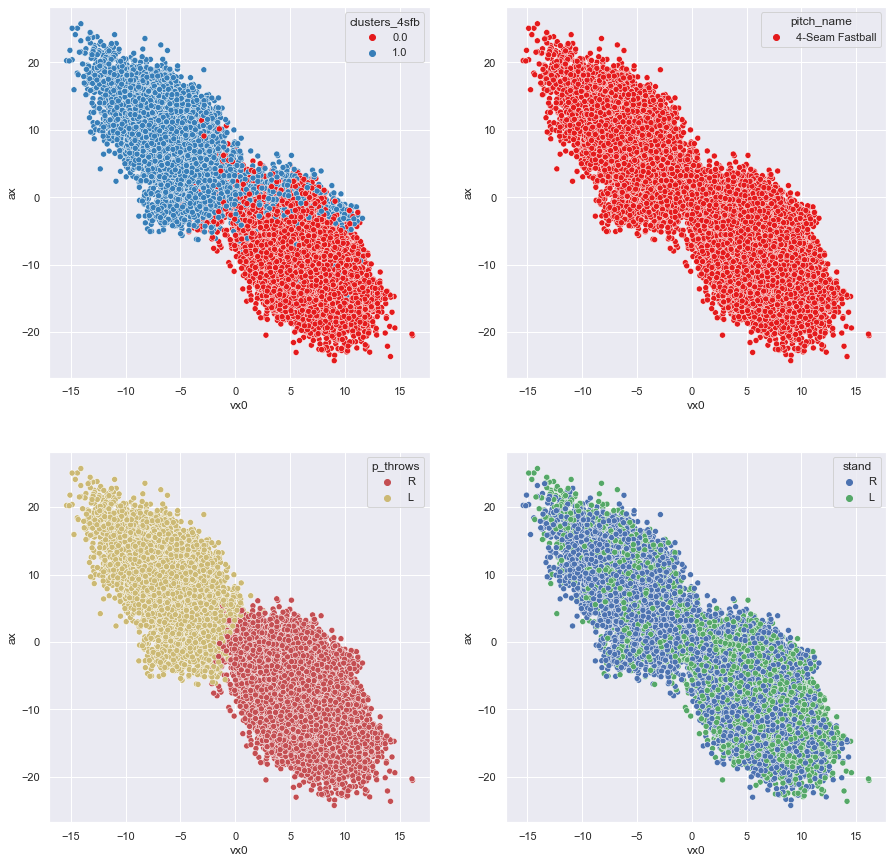

In [109]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_plot, x='vx0', y='ax', hue='clusters_4sfb', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_plot, x='vx0', y='ax', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_plot, x='vx0', y='ax', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_plot, x='vx0', y='ax', hue='stand', palette=['b','g'], ax=axes[1,1])

plt.show()

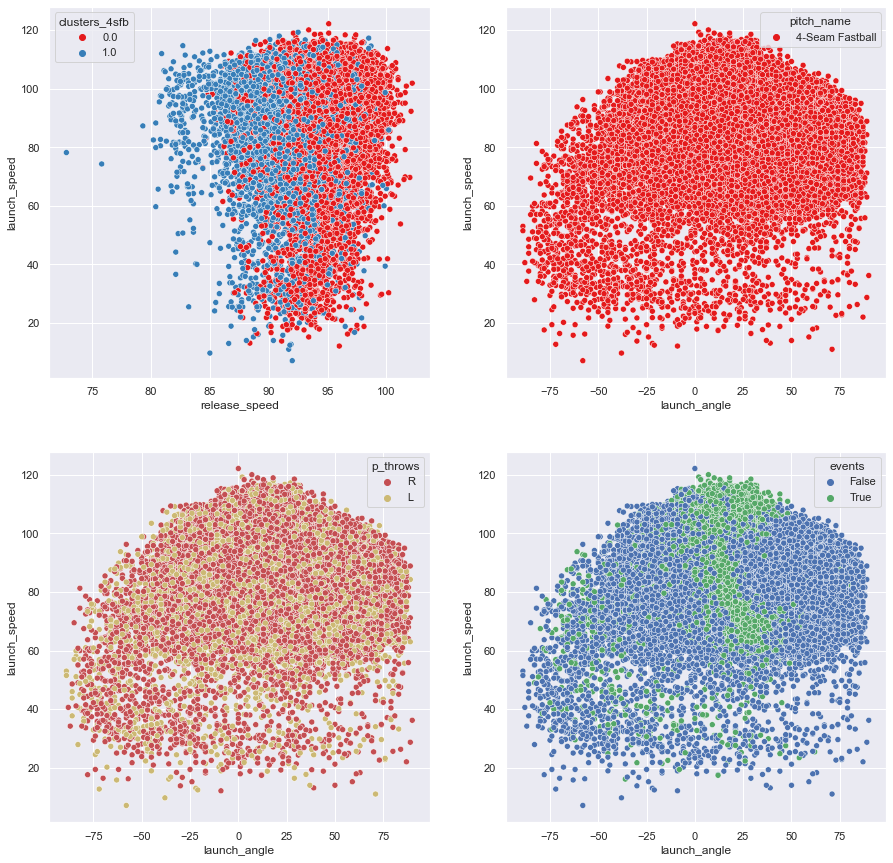

In [110]:
#set seaborn plotting aesthetics as default
sns.set_theme()

#define plotting region (1 row, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

sns.scatterplot(data=df_plot, x='release_speed', y='launch_speed', hue='clusters_4sfb', palette='Set1', ax=axes[0,0])
sns.scatterplot(data=df_plot, x='launch_angle', y='launch_speed', hue='pitch_name', palette='Set1', ax=axes[0,1])
sns.scatterplot(data=df_plot, x='launch_angle', y='launch_speed', hue='p_throws', palette=['r','y'], ax=axes[1,0])
sns.scatterplot(data=df_plot, x='launch_angle', y='launch_speed', hue=df_plot['events'].isin(hits), palette=['b','g'], ax=axes[1,1])

plt.show()

In [112]:
df_merged_5.to_csv(os.path.join(path, '02 data', 'prepared data', 'bip_clusters2.csv'))